In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns




# Load the dataset
file_path = "/Volumes/Emilio's Ex/code/Data/OpenBiomechanicsProject/openbiomechanics/high_performance/data/hp_obp.csv"
df = pd.read_csv(file_path)

# Display the first few rows of the dataset to understand its structure
df.head()
df.shape

(1934, 53)

In [2]:

unique_athlete_ids = df['athlete_uid'].nunique()
total_rows = len(df)
print(total_rows)

1934


In [3]:


# Select the relevant columns for lower body testing
cols = ['jump_height_(imp-mom)_[cm]_mean_cmj', 'lower-limb_stiffness_[n/m]_mean_cmj', 
        'peak_power_[w]_mean_cmj', 'peak_power_/_bm_[w/kg]_mean_cmj', 'eccentric_braking_rfd_[n/s]_mean_cmj',
        'eccentric_duration_[ms]_mean_cmj', 'concentric_duration_[ms]_mean_cmj', 'rsi-modified_[m/s]_mean_cmj']

# Remove rows with missing values
df_cleaned = df[cols].dropna()

# Prepare the data for clustering
X = df_cleaned.values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-means clustering
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(X_scaled)
df_cleaned['cluster'] = labels

# Create a parallel coordinates plot
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = df_cleaned['cluster'],
                   colorscale = [[0,'purple'],[0.5,'lightseagreen'],[1,'gold']]),
        dimensions = list([
            dict(range = [df_cleaned[col].min(), df_cleaned[col].max()],
                 label = col, values = df_cleaned[col])
            for col in cols
        ])
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white',
    title_text = 'Lower Body Testing Metrics Clusters',
    title_x = 0.5,
    font=dict(size=12),
    margin=dict(l=150, r=100, t=100, b=100),
)

fig.show()

# Print insights
print("Cluster Analysis Insights:")
for i in range(n_clusters):
    print(f"\nCluster {i+1}:")
    print("Number of players:", len(df_cleaned[df_cleaned['cluster'] == i]))
    print("Characteristics:")
    cluster_data = df_cleaned[df_cleaned['cluster'] == i]
    for col in cols:
        print(f"- {col}: Mean = {cluster_data[col].mean():.2f}, Std = {cluster_data[col].std():.2f}")

/Users/EmilioMartinez_1/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster Analysis Insights:

Cluster 1:
Number of players: 686
Characteristics:
- jump_height_(imp-mom)_[cm]_mean_cmj: Mean = 44.11, Std = 6.63
- lower-limb_stiffness_[n/m]_mean_cmj: Mean = 7134.77, Std = 2217.55
- peak_power_[w]_mean_cmj: Mean = 5567.27, Std = 750.51
- peak_power_/_bm_[w/kg]_mean_cmj: Mean = 61.24, Std = 6.89
- eccentric_braking_rfd_[n/s]_mean_cmj: Mean = 9115.01, Std = 1973.60
- eccentric_duration_[ms]_mean_cmj: Mean = 445.58, Std = 37.76
- concentric_duration_[ms]_mean_cmj: Mean = 250.87, Std = 25.15
- rsi-modified_[m/s]_mean_cmj: Mean = 0.84, Std = 2.73

Cluster 2:
Number of players: 414
Characteristics:
- jump_height_(imp-mom)_[cm]_mean_cmj: Mean = 27.28, Std = 5.54
- lower-limb_stiffness_[n/m]_mean_cmj: Mean = 3643.25, Std = 1275.56
- peak_power_[w]_mean_cmj: Mean = 2767.38, Std = 906.88
- peak_power_/_bm_[w/kg]_mean_cmj: Mean = 42.02, Std = 5.67
- eccentric_braking_rfd_[n/s]_mean_cmj: Mean = 3584.46, Std = 1417.72
- eccentric_duration_[ms]_mean_cmj: Mean = 518.59

In [81]:

# Remove the specified columns
columns_to_remove = ['test_date', 'playing_level', 'athlete_uid','bat_speed_mph_group','hitting_session_date','pitch_speed_mph_group','pitching_session_date']
df_clean = df.drop(columns=columns_to_remove)

# Remove rows with missing values in 'bat_speed_mph' column
df_clean = df_clean.dropna(subset=['pitch_speed_mph'])

# Calculate the Pearson correlation coefficient for each column with 'bat_speed_mph'
correlations = {}
for column in df_clean.columns:
    if column != 'pitch_speed_mph':
        correlation = df_clean[column].corr(df_clean['pitch_speed_mph'])
        correlations[column] = correlation

# Sort the correlations by absolute value in descending order
sorted_correlations = sorted(correlations.items(), key=lambda x: abs(x[1]), reverse=True)

# Print the correlations
print("Correlations with Pitch Speed:")
for column, correlation in sorted_correlations:
    print(f"{column}: {correlation:.3f}")

Correlations with Pitch Speed:
bat_speed_mph: 0.781
peak_power_[w]_mean_cmj: 0.758
concentric_peak_force_[n]_mean_cmj: 0.730
eccentric_peak_force_[n]_mean_cmj: 0.726
body_weight_[lbs]: 0.688
jump_height_(imp-mom)_[cm]_mean_cmj: 0.671
peak_power_[w]_mean_sj: 0.665
peak_power_/_bm_[w/kg]_mean_cmj: 0.654
eccentric_braking_rfd_[n/s]_mean_cmj: 0.598
jump_height_(imp-mom)_[cm]_mean_sj: 0.558
peak_power_/_bm_[w/kg]_mean_sj: 0.538
best_rsi_(jump_height/contact_time)_[m/s]_mean_ht: 0.474
best_jump_height_(flight_time)_[cm]_mean_ht: 0.469
best_rsi_(flight/contact_time)_mean_ht: 0.431
peak_vertical_force_[n]_max_imtp: 0.427
pitching_max_hss: 0.427
net_peak_vertical_force_[n]_max_imtp: 0.415
lower-limb_stiffness_[n/m]_mean_cmj: 0.404
countermovement_depth_[cm]_mean_cmj: -0.397
ShoulderIRR: 0.338
force_at_200ms_[n]_max_imtp: 0.323
force_at_150ms_[n]_max_imtp: 0.315
force_at_100ms_[n]_max_imtp: 0.308
ShoulderERL: 0.300
peak_takeoff_force_[n]_mean_pp: 0.298
concentric_duration_[ms]_mean_cmj: -0.260
r

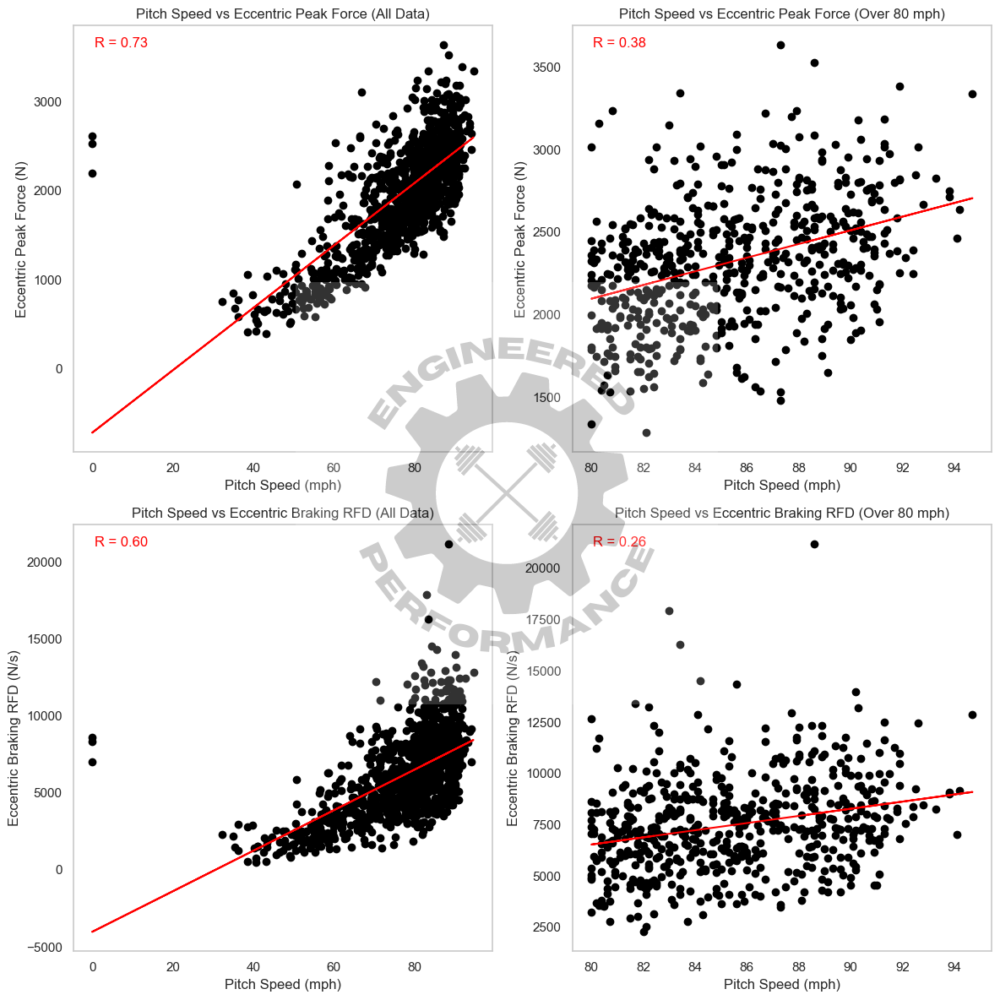

In [117]:
from scipy import stats
from PIL import Image

# Remove rows with infinite or NaN values from the entire dataset
df_clean = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['pitch_speed_mph', 'eccentric_peak_force_[n]_mean_cmj','eccentric_braking_rfd_[n/s]_mean_cmj'])

# Filter the DataFrame for pitch speeds over 80 mph
df_over_80 = df_clean[df_clean['pitch_speed_mph'] > 79.9]

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))

# Load and display the PNG image as the background
img = Image.open("/Users/EmilioMartinez_1/Downloads/engr_logo.PNG")
img_width, img_height = img.size
fig_width, fig_height = fig.get_size_inches() * fig.dpi

# Calculate the position to center the image
x = (fig_width - img_width) / 2
y = (fig_height - img_height) / 2

# Display the image on the figure
fig.figimage(img, x, y, alpha=.2, zorder=1)

# Scatter plot for the entire dataset (Eccentric Peak Force)
ax1.scatter(df_clean['pitch_speed_mph'], df_clean['eccentric_peak_force_[n]_mean_cmj'], color='black')
ax1.set_xlabel('Pitch Speed (mph)')
ax1.set_ylabel('Eccentric Peak Force (N)')
ax1.set_title('Pitch Speed vs Eccentric Peak Force (All Data)')
ax1.grid(False)

# Calculate and display the correlation coefficient and regression line for the entire dataset (Eccentric Peak Force)
slope_all_force, intercept_all_force, r_value_all_force, _, _ = stats.linregress(df_clean['pitch_speed_mph'], df_clean['eccentric_peak_force_[n]_mean_cmj'])
ax1.annotate(f'R = {r_value_all_force:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', color='red')
ax1.plot(df_clean['pitch_speed_mph'], slope_all_force * df_clean['pitch_speed_mph'] + intercept_all_force, color='red')

# Scatter plot for pitch speeds over 80 mph (Eccentric Peak Force)
ax2.scatter(df_over_80['pitch_speed_mph'], df_over_80['eccentric_peak_force_[n]_mean_cmj'], color='black')
ax2.set_xlabel('Pitch Speed (mph)')
ax2.set_ylabel('Eccentric Peak Force (N)')
ax2.set_title('Pitch Speed vs Eccentric Peak Force (Over 80 mph)')
ax2.grid(False)

# Calculate and display the correlation coefficient and regression line for pitch speeds over 80 mph (Eccentric Peak Force)
slope_over_80_force, intercept_over_80_force, r_value_over_80_force, _, _ = stats.linregress(df_over_80['pitch_speed_mph'], df_over_80['eccentric_peak_force_[n]_mean_cmj'])
ax2.annotate(f'R = {r_value_over_80_force:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', color='red')
ax2.plot(df_over_80['pitch_speed_mph'], slope_over_80_force * df_over_80['pitch_speed_mph'] + intercept_over_80_force, color='red')

# Scatter plot for the entire dataset (Eccentric Braking RFD)
ax3.scatter(df_clean['pitch_speed_mph'], df_clean['eccentric_braking_rfd_[n/s]_mean_cmj'], color='black')
ax3.set_xlabel('Pitch Speed (mph)')
ax3.set_ylabel('Eccentric Braking RFD (N/s)')
ax3.set_title('Pitch Speed vs Eccentric Braking RFD (All Data)')
ax3.grid(False)

# Calculate and display the correlation coefficient and regression line for the entire dataset (Eccentric Braking RFD)
slope_all_rfd, intercept_all_rfd, r_value_all_rfd, _, _ = stats.linregress(df_clean['pitch_speed_mph'], df_clean['eccentric_braking_rfd_[n/s]_mean_cmj'])
ax3.annotate(f'R = {r_value_all_rfd:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', color='red')
ax3.plot(df_clean['pitch_speed_mph'], slope_all_rfd * df_clean['pitch_speed_mph'] + intercept_all_rfd, color='red')

# Scatter plot for pitch speeds over 80 mph (Eccentric Braking RFD)
ax4.scatter(df_over_80['pitch_speed_mph'], df_over_80['eccentric_braking_rfd_[n/s]_mean_cmj'], color='black')
ax4.set_xlabel('Pitch Speed (mph)')
ax4.set_ylabel('Eccentric Braking RFD (N/s)')
ax4.set_title('Pitch Speed vs Eccentric Braking RFD (Over 80 mph)')
ax4.grid(False)

# Calculate and display the correlation coefficient and regression line for pitch speeds over 80 mph (Eccentric Braking RFD)
slope_over_80_rfd, intercept_over_80_rfd, r_value_over_80_rfd, _, _ = stats.linregress(df_over_80['pitch_speed_mph'], df_over_80['eccentric_braking_rfd_[n/s]_mean_cmj'])
ax4.annotate(f'R = {r_value_over_80_rfd:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', color='red')
ax4.plot(df_over_80['pitch_speed_mph'], slope_over_80_rfd * df_over_80['pitch_speed_mph'] + intercept_over_80_rfd, color='red')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()



/var/folders/jn/wfpqyzfx0t7cprw54pg29r1h0000gn/T/ipykernel_2357/3910471206.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/EmilioMartinez_1/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/var/folders/jn/wfpqyzfx0t7cprw54pg29r1h0000gn/T/ipykernel_2357/3910471206.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



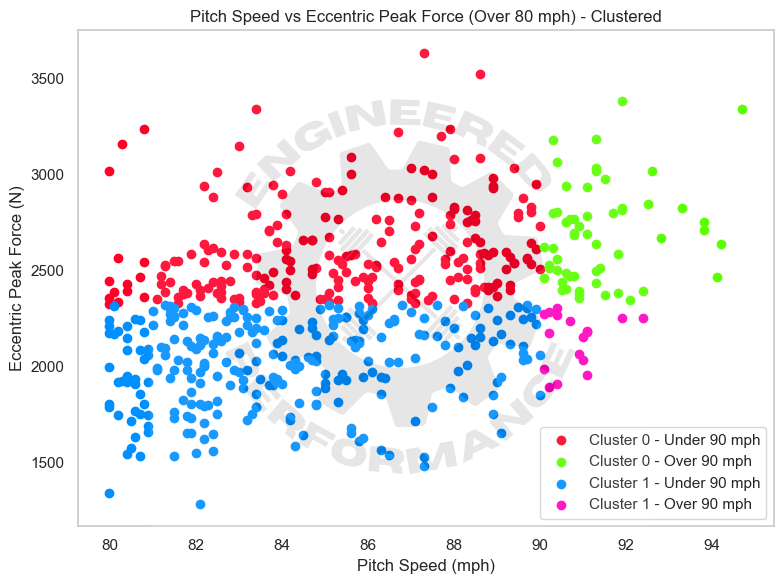

In [127]:
from sklearn.cluster import KMeans

# Filter the DataFrame for pitch speeds over 80 mph
df_over_80 = df_clean[df_clean['pitch_speed_mph'] > 79.9]

# Create a new DataFrame with only the required columns
df_cluster = df_over_80[['pitch_speed_mph', 'eccentric_peak_force_[n]_mean_cmj']]

# Add a new column to indicate if the pitch speed is over or under 90 mph
df_cluster['speed_category'] = df_cluster['pitch_speed_mph'].apply(lambda x: 'Over 90 mph' if x > 90 else 'Under 90 mph')

# Perform K-means clustering with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)
df_cluster['cluster'] = kmeans.fit_predict(df_cluster[['pitch_speed_mph', 'eccentric_peak_force_[n]_mean_cmj']])

# Create a new figure and axis for the separate plot
fig_cluster, ax_cluster = plt.subplots(figsize=(8, 6))

# Create a color map based on the 'gist_rainbow' color palette
color_map = plt.cm.gist_rainbow(np.linspace(0, 1, len(df_cluster['cluster'].unique()) * len(df_cluster['speed_category'].unique())))

# Initialize a color index
color_index = 0

# Scatter plot for pitches over 80 mph, colored by cluster and speed category
for cluster in df_cluster['cluster'].unique():
    for category in df_cluster['speed_category'].unique():
        data = df_cluster[(df_cluster['cluster'] == cluster) & (df_cluster['speed_category'] == category)]
        ax_cluster.scatter(data['pitch_speed_mph'], data['eccentric_peak_force_[n]_mean_cmj'], color=color_map[color_index], label=f'Cluster {cluster} - {category}')
        color_index += 1

# Set labels and title
ax_cluster.set_xlabel('Pitch Speed (mph)')
ax_cluster.set_ylabel('Eccentric Peak Force (N)')
ax_cluster.set_title('Pitch Speed vs Eccentric Peak Force (Over 80 mph) - Clustered')

# Add a legend
ax_cluster.legend()
# Load and display the PNG image as the background with alpha 0.1
img = Image.open("/Users/EmilioMartinez_1/Downloads/engr_logo.PNG")
img_width, img_height = img.size
fig_width, fig_height = fig_cluster.get_size_inches() * fig_cluster.dpi

# Calculate the position to center the image
x = (fig_width - img_width) / 2
y = (fig_height - img_height) / 2

# Display the image on the figure with alpha 0.1
fig_cluster.figimage(img, x, y, alpha=0.1, zorder=1)

# Display the plot
plt.tight_layout()
plt.grid(False)
plt.show()


In [134]:
import pygame
import pymunk
import pymunk.pygame_util
import math
import sys
from pygame import Vector2

# Initialize Pygame and Pymunk
pygame.init()
WIDTH = 800
HEIGHT = 600
screen = pygame.display.set_mode((WIDTH, HEIGHT))
pygame.display.set_caption("Engineered Performance Physics Simulation")

# Physics space setup
space = pymunk.Space()
space.gravity = (0, 0)  # No gravity for clearer demonstration
draw_options = pymunk.pygame_util.DrawOptions(screen)

# Load and prepare logo
logo = pygame.image.load("/Users/EmilioMartinez_1/Downloads/engr_logo.PNG")
# Scale logo to desired size (e.g., 300x300 pixels)
logo = pygame.transform.scale(logo, (300, 300))
# Create a surface with per-pixel alpha
logo_surface = pygame.Surface(logo.get_size(), pygame.SRCALPHA)
# Blit the logo onto the surface with desired alpha (0-255)
logo_surface.fill((255, 255, 255, 50))  # Last value is alpha (50 = very transparent)
logo_surface.blit(logo, (0, 0), special_flags=pygame.BLEND_RGBA_MULT)
# Calculate position to center the logo
logo_pos = ((WIDTH - logo_surface.get_width()) // 2, 
            (HEIGHT - logo_surface.get_height()) // 2)

# Colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)
RED = (255, 107, 107)
BLUE = (69, 179, 224)
GREEN = (78, 205, 196)

def create_rectangle(pos, angle, color):
    """Create a rectangle with physics properties"""
    mass = 1
    size = (60, 30)
    moment = pymunk.moment_for_box(mass, size)
    body = pymunk.Body(mass, moment)
    body.position = pos
    body.angle = angle
    
    shape = pymunk.Poly.create_box(body, size)
    shape.elasticity = 0.5
    shape.friction = 0.7
    shape.color = color
    
    return body, shape

def create_barrier():
    """Create static barrier"""
    barrier_body = pymunk.Body(body_type=pymunk.Body.STATIC)
    barrier_shape = pymunk.Segment(barrier_body, (600, 0), (600, HEIGHT), 10)
    barrier_shape.elasticity = 0.5
    barrier_shape.friction = 0.7
    barrier_shape.color = (100, 100, 100, 255)
    return barrier_body, barrier_shape

# Create objects with different approach angles
rectangles = [
    create_rectangle((100, 150), 0, RED),         # Direct impact (90°)
    create_rectangle((100, 300), math.pi/4, GREEN),  # 45° angle
    create_rectangle((100, 450), math.pi/12, BLUE)   # 15° angle
]

# Add objects to space
barrier_body, barrier_shape = create_barrier()
space.add(barrier_body, barrier_shape)

for body, shape in rectangles:
    body.velocity = (200, 0)  # Initial velocity
    space.add(body, shape)

# Simulation loop
clock = pygame.time.Clock()
running = True
paused = True

font = pygame.font.Font(None, 36)

while running:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
        elif event.type == pygame.KEYDOWN:
            if event.key == pygame.K_SPACE:
                paused = not paused
            elif event.key == pygame.K_r:  # Reset simulation
                # Remove all objects except barrier
                for body, shape in rectangles:
                    space.remove(body, shape)
                
                # Recreate objects
                rectangles = [
                    create_rectangle((100, 150), 0, RED),
                    create_rectangle((100, 300), math.pi/4, GREEN),
                    create_rectangle((100, 450), math.pi/12, BLUE)
                ]
                
                for body, shape in rectangles:
                    body.velocity = (200, 0)
                    space.add(body, shape)
            elif event.key == pygame.K_ESCAPE:
                running = False

    screen.fill(WHITE)
    
    # Draw logo in background
    screen.blit(logo_surface, logo_pos)
    
    # Draw instructions
    text = font.render("Space: Start/Pause  R: Reset  ESC: Quit", True, BLACK)
    screen.blit(text, (10, 10))
    
    # Draw angle labels
    angles = ["90°", "45°", "15°"]
    for i, angle in enumerate(angles):
        text = font.render(angle, True, BLACK)
        screen.blit(text, (30, 140 + i * 150))

    if not paused:
        space.step(1/60.0)
    
    # Draw physics objects
    space.debug_draw(draw_options)
    
    pygame.display.flip()
    clock.tick(60)

pygame.quit()
sys.exit()

Exception ignored from cffi callback <function ext_cpSpaceDebugDrawColorForShapeImpl at 0x2bf85c790>:
Traceback (most recent call last):
  File "/Users/EmilioMartinez_1/Library/Python/3.9/lib/python/site-packages/pymunk/_callbacks.py", line 176, in ext_cpSpaceDebugDrawColorForShapeImpl
    return options.color_for_shape(shape)
  File "/Users/EmilioMartinez_1/Library/Python/3.9/lib/python/site-packages/pymunk/space_debug_draw_options.py", line 332, in color_for_shape
    return SpaceDebugColor(*shape.color)
TypeError: <lambda>() missing 1 required positional argument: 'a'
Exception ignored from cffi callback <function ext_cpSpaceDebugDrawColorForShapeImpl at 0x2bf85c790>:
Traceback (most recent call last):
  File "/Users/EmilioMartinez_1/Library/Python/3.9/lib/python/site-packages/pymunk/_callbacks.py", line 176, in ext_cpSpaceDebugDrawColorForShapeImpl
    return options.color_for_shape(shape)
  File "/Users/EmilioMartinez_1/Library/Python/3.9/lib/python/site-packages/pymunk/space_debu

SystemExit: 

: 